


# Aleph2Image (Gamma)


> "I was afraid that not a
single thing on earth would ever again surprise me"

-Jorge Luis Borges



---




#### What is this?

This is a notebook that uses DALL-E's decoder and CLIP to generate images from text. I will very likely make this better & easier to use in the future.

Feel free to send correspondence to [@advadnoun](https://twitter.com/advadnoun) on Twitter. If you use this notebook or modify it, please be cool and link back to my twitter. 

If you're feeling generous while your Waluigi (or whatever you choose) loads, you can donate to @rynnn on Venmo :)



---



#### Thanks!

Many thanks to OpenAI for releasing their models CLIP and DALL-E (the encoder and decoder parts, specifically). I am not affiliated with them.


https://github.com/openai/DALL-E/ (Aditya Ramesh, Mikhail Pavlov, Gabriel Goh, Scott Gray, Chelsea Voss, Alec Radford, Mark Chen, Ilya Sutskever)

https://github.com/openai/CLIP (Alec Radford, \* Jong Wook Kim,\* Chris Hallacy, Aditya Ramesh, Gabriel Goh, Sandhini Agarwal,
Girish Sastry, Amanda Askell, Pamela Mishkin, Jack Clark, Gretchen Krueger, Ilya Sutskever)

\* equal contribution

Also, as a good launching point for future directions and to find more related work, see https://distill.pub/2017/feature-visualization/ by Chris Olah, Alexander Mordvintsev, Ludwig Schubert.



---



# How do I use this?

First, type in your description where it says *Insert text here*.


Second, click the 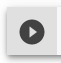 
button that shows up next to the text under the heading **This one!**. The button appears when you move your mouse over the text **This one!** Wait for a bit as it loads and goes in circles, and then move on to the third step when it finishes running.

Third, click on the upper bar at the top of the page where it says **Runtime**, and then click **Restart and run all**. 

Your output will appear at the bottom of this page as it trains after a little while. Scroll down below everything else to see new images appear. The images will start by looking like dirt, but the page will eventually ding and show new images as it begins to attempt to match the image to your description. 

# Choose Text

In [3]:

text_input = '''a cat giving a Ted Talk'''




# This one!

In [4]:
import subprocess

CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("UTF-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
print("CUDA version:", CUDA_version)

if CUDA_version == "10.0":
    torch_version_suffix = "+cu100"
elif CUDA_version == "10.1":
    torch_version_suffix = "+cu101"
elif CUDA_version == "10.2":
    torch_version_suffix = ""
else:
    torch_version_suffix = "+cu110"

!pip install torch==1.7.1{torch_version_suffix} torchvision==0.8.2{torch_version_suffix} -f https://download.pytorch.org/whl/torch_stable.html ftfy regex

CUDA version: 11.0
Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [5]:
# were you lucky today?

!nvidia-smi -L


GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-a6f9bbe4-7222-fe90-0643-c62f290a3b86)


# Top (imports)


In [6]:
# don't use half of these lol

import torch
import numpy as np
import torchvision
import torchvision.transforms.functional as TF
!pip install kornia
import kornia

import PIL
import matplotlib.pyplot as plt

import os
import random
import imageio
from IPython import display
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import glob

from google.colab import output



# Perceptor

In [7]:


%cd /content/

!git clone https://github.com/openai/CLIP.git


%cd /content/CLIP/

!pip install ftfy

import os
import clip
import torch

clip.available_models()

import numpy as np

# Load the model
perceptor, preprocess = clip.load('ViT-B/32', jit=True)
perceptor = perceptor.eval()

/content
fatal: destination path 'CLIP' already exists and is not an empty directory.
/content/CLIP


['RN50', 'RN101', 'RN50x4', 'ViT-B/32']

# Params

In [8]:
# probably don't mess with this unless you're changing generator size
im_shape = [512, 512, 3]
sideX, sideY, channels = im_shape
batch_size = 1

# Define

In [9]:
def displ(img, pre_scaled=True):
  img = np.array(img)[:,:,:]
  img = np.transpose(img, (1, 2, 0))
  if not pre_scaled:
    img = scale(img, 48*4, 32*4)
  imageio.imwrite(str(3) + '.png', np.array(img))
  return display.Image(str(3)+'.png')

def gallery(array, ncols=2):
    nindex, height, width, intensity = array.shape
    nrows = nindex//ncols
    assert nindex == nrows*ncols
    # want result.shape = (height*nrows, width*ncols, intensity)
    result = (array.reshape(nrows, ncols, height, width, intensity)
              .swapaxes(1,2)
              .reshape(height*nrows, width*ncols, intensity))
    return result

def card_padded(im, to_pad=3):
  return np.pad(np.pad(np.pad(im, [[1,1], [1,1], [0,0]],constant_values=0), [[2,2], [2,2], [0,0]],constant_values=1),
            [[to_pad,to_pad], [to_pad,to_pad], [0,0]],constant_values=0)

def get_all(img):
  img = np.transpose(img, (0,2,3,1))
  cards = np.zeros((img.shape[0], sideX+12, sideY+12, 3))
  for i in range(len(img)):
    cards[i] = card_padded(img[i])
  print(img.shape)
  cards = gallery(cards)
  imageio.imwrite(str(3) + '.png', np.array(cards))
  return display.Image(str(3)+'.png')
  

# Generator

In [10]:
import io
import os, sys
import requests
import PIL

import torch
import torchvision.transforms as T
import torchvision.transforms.functional as TF

!pip install git+https://github.com/openai/DALL-E.git


from dall_e import map_pixels, unmap_pixels, load_model
target_image_size = sideX

def preprocess(img):
    s = min(img.size)
    
    if s < target_image_size:
        raise ValueError(f'min dim for image {s} < {target_image_size}')
        
    r = target_image_size / s
    s = (round(r * img.size[1]), round(r * img.size[0]))
    img = TF.resize(img, s, interpolation=PIL.Image.LANCZOS)
    img = TF.center_crop(img, output_size=2 * [target_image_size])
    img = torch.unsqueeze(T.ToTensor()(img), 0)
    return map_pixels(img)


model = load_model("https://cdn.openai.com/dall-e/decoder.pkl", 'cuda')


/usr/local/lib/python3.7/dist-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.4) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


  Cloning https://github.com/openai/DALL-E.git to /tmp/pip-req-build-ntf8yduv
  Running command git clone -q https://github.com/openai/DALL-E.git /tmp/pip-req-build-ntf8yduv
  Created wheel for DALL-E: filename=DALL_E-0.1-cp37-none-any.whl size=6000 sha256=a2d3801df6f310a30993f6cc832bab8a3ecd943cb35aed9e789ff226afa60e6e
  Stored in directory: /tmp/pip-ephem-wheel-cache-q0mf6h4m/wheels/e9/f5/e7/efa7ddb4c5899f6e6ffbbd112b8c7a030872274a5cba9ccf04
Successfully built DALL-E


In [11]:
# enc = load_model("https://cdn.openai.com/dall-e/encoder.pkl", 'cpu')


In [12]:

# import sys
# import numpy
# numpy.set_printoptions(threshold=sys.maxsize)


# # x = imageio.imread('/content/download - 2021-02-22T174209.162.png')
# x = (255*torch.rand(512, 512, 3).cpu().numpy()).astype(np.uint8)
# # displ(x[0])

# def preprocess(img):
#     s = min(img.size)
    
#     if s < target_image_size:
#         raise ValueError(f'min dim for image {s} < {target_image_size}')
        
#     r = target_image_size / s
#     s = (round(r * img.size[1]), round(r * img.size[0]))
#     img = TF.resize(img, s, interpolation=PIL.Image.LANCZOS)
#     img = TF.center_crop(img, output_size=2 * [target_image_size])
#     img = torch.unsqueeze(T.ToTensor()(img), 0)
#     return map_pixels(img)


# x = preprocess(PIL.Image.fromarray(x))

# z_logits = enc(x)
# z = torch.argmax(z_logits, axis=1)
# z = torch.nn.functional.one_hot(z, num_classes=enc.vocab_size).permute(0, 3, 1, 2).float()

# x_stats = model(z.cuda()).float()
# x_rec = unmap_pixels(torch.sigmoid(x_stats[:, :3]))
# displ(x_rec[0].detach().cpu())

# print(z.sum([1]))
# print(z_logits.shape)
# print(torch.topk(z,k=2,dim=1))

# Latent coordinate

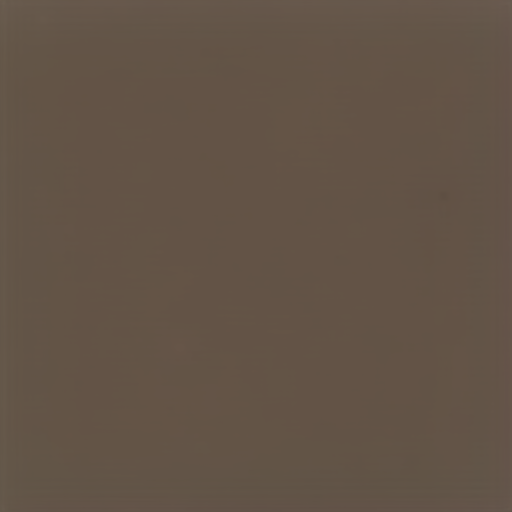

In [20]:


class Pars(torch.nn.Module):
    def __init__(self):
        super(Pars, self).__init__()


        hots = torch.nn.functional.one_hot((torch.arange(0, 8192).to(torch.int64)), num_classes=8192)
        rng = torch.zeros(batch_size, 64*64, 8192).uniform_()
        for b in range(batch_size):
          for i in range(64*64):
            rng[b,i] = hots[[np.random.randint(8191)]]

        rng = rng.permute(0, 2, 1)

        self.normu = torch.nn.Parameter(rng.cuda().view(batch_size, 8192, 64 * 64))
        




    def forward(self):

      
      normu = torch.nn.functional.gumbel_softmax(self.normu.reshape(batch_size, int(8192/(2)), -1), dim=1, tau=hadies).flatten()[:8192* 64* 64].view(batch_size, 8192, 64, 64)
      return normu


lats = Pars().cuda()
mapper = [lats.normu]
optimizer = torch.optim.Adam([{'params': mapper, 'lr': .01}])
eps = 0



tx = clip.tokenize(text_input)
t = perceptor.encode_text(tx.cuda()).detach().clone()


nom = torchvision.transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
# augs = torch.nn.Sequential(kornia.augmentation.ColorJitter(.1,.1,.1,.1, p=.5)).cuda()
augs = kornia.augmentation.RandomRotation(30).cuda()

will_it = False
hadies = 2.
with torch.no_grad():
  al = unmap_pixels(torch.sigmoid(model(lats()).cpu().float())).numpy()
  for allls in al:
    displ(allls[:3])
    print('\n')
  # print(lats())
  # print(lats().sum())

In [28]:
from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw 
import shutil


# Train

To see a World in a Grain of Sand


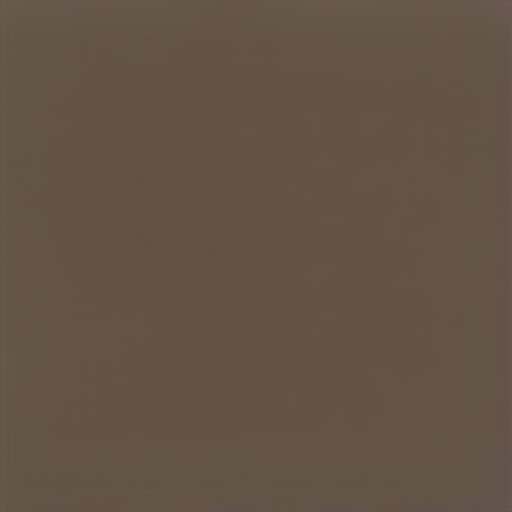

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


temp 2.0
0.01005 lr


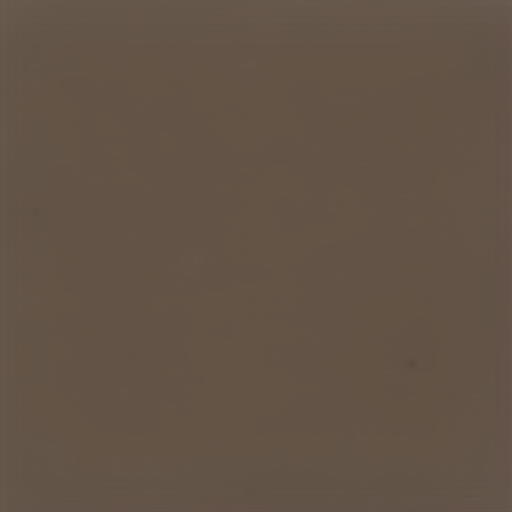




  ##########################################################
   [0, tensor([-2.3496], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 0
temp 2.0
0.0165490183457711 lr


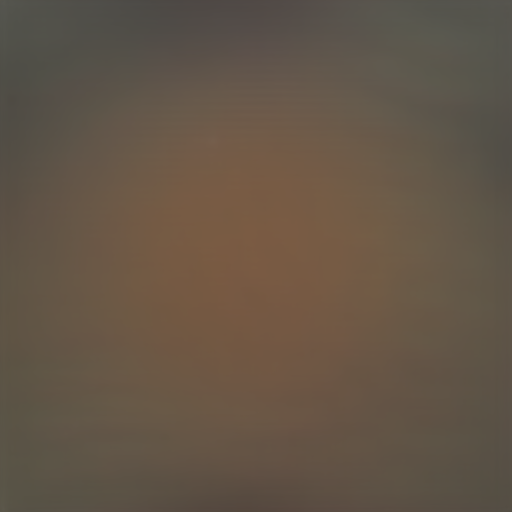




  ##########################################################
   [0, tensor([-2.4844], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 100
temp 2.0
0.027250747085439654 lr


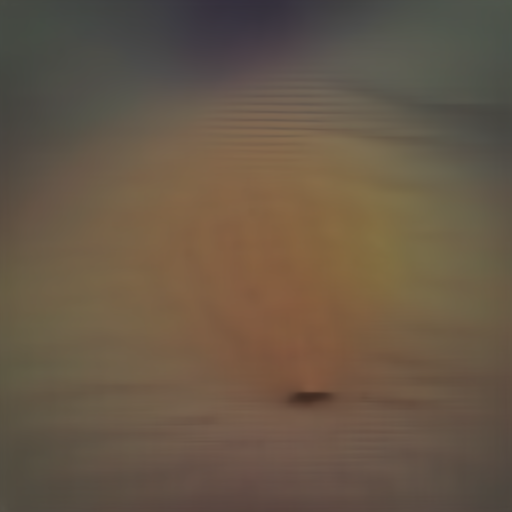




  ##########################################################
   [0, tensor([-2.6836], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 200
temp 2.0
0.0448729466122298 lr


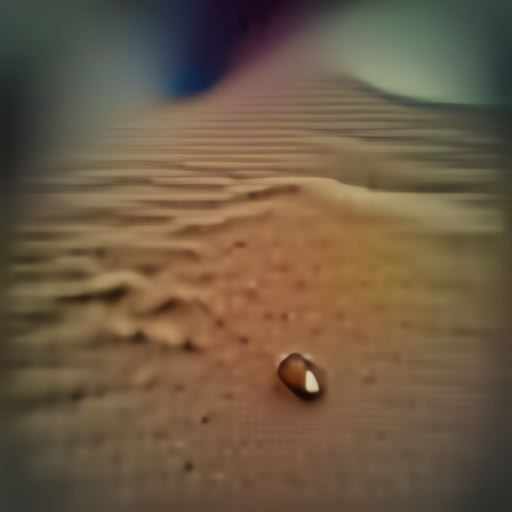




  ##########################################################
   [0, tensor([-3.4355], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 300
temp 2.0
0.07389086733478589 lr


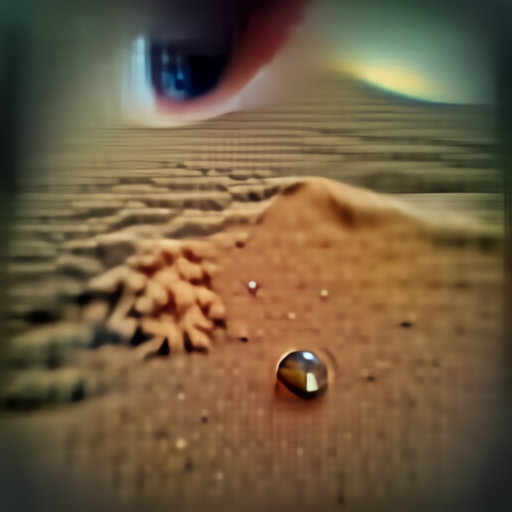




  ##########################################################
   [0, tensor([-3.7676], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 400
temp 2.0
0.12 lr


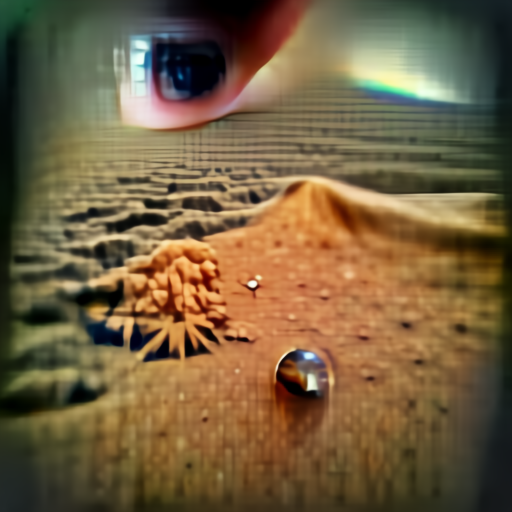




  ##########################################################
   [0, tensor([-3.8945], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 500
And a Heaven in a Wild Flower 


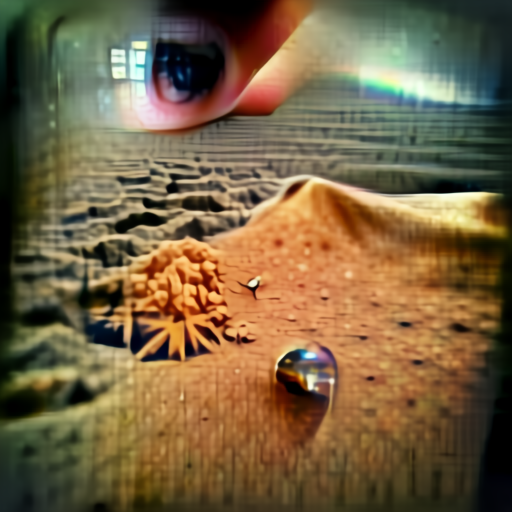



temp 2.0
0.12 lr


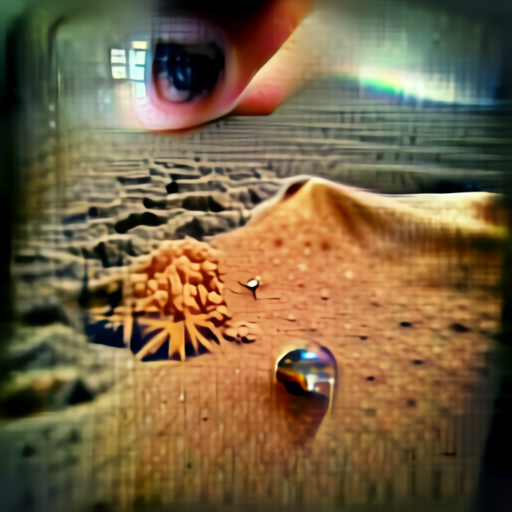




  ##########################################################
   [0, tensor([-2.3594], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 600
temp 2.0
0.12 lr


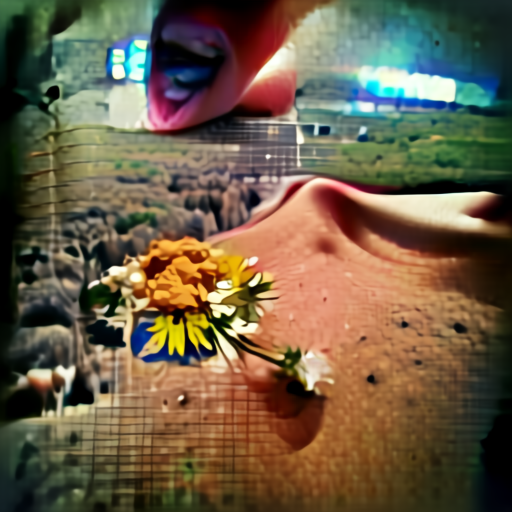




  ##########################################################
   [0, tensor([-3.4453], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 700
temp 2.0
0.12 lr


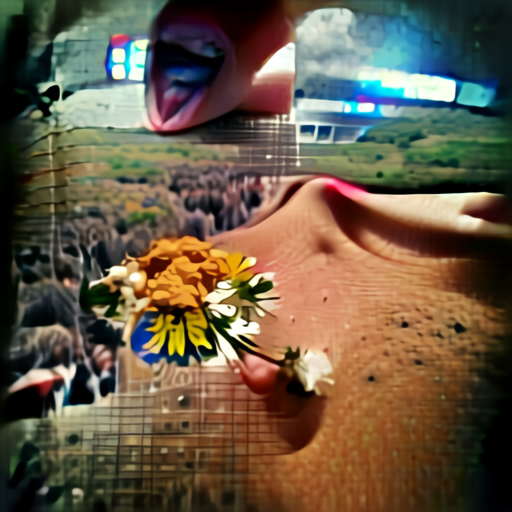




  ##########################################################
   [0, tensor([-3.6426], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 800
temp 2.0
0.12 lr


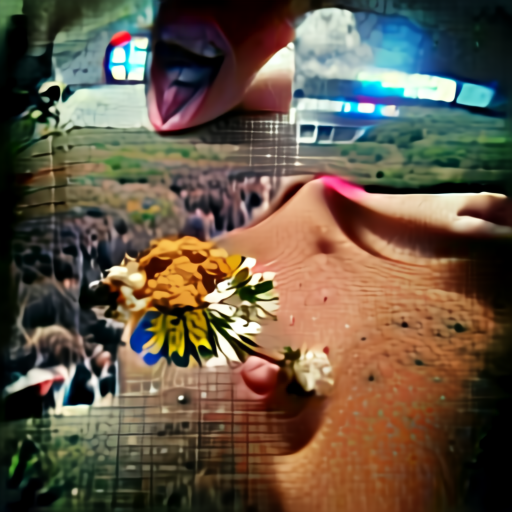




  ##########################################################
   [0, tensor([-3.6875], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 900
temp 2.0
0.12 lr


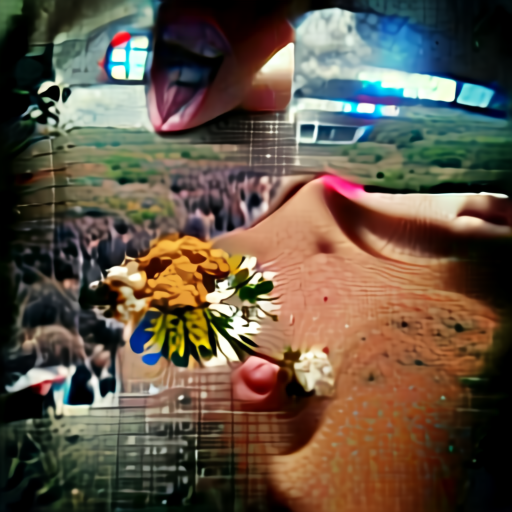




  ##########################################################
   [0, tensor([-3.6895], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1000
temp 2.0
0.12 lr


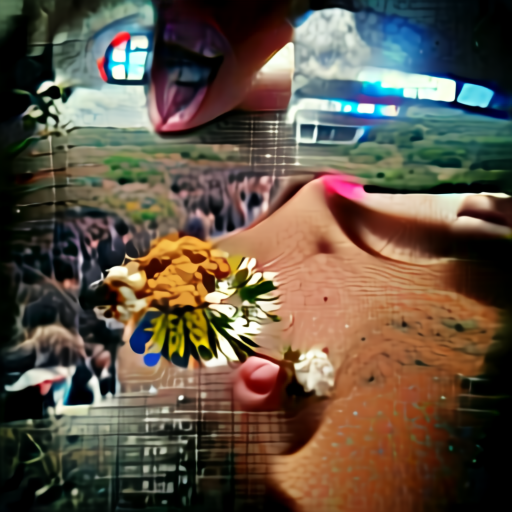




  ##########################################################
   [0, tensor([-3.6953], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1100
Hold Infinity in the palm of your hand 


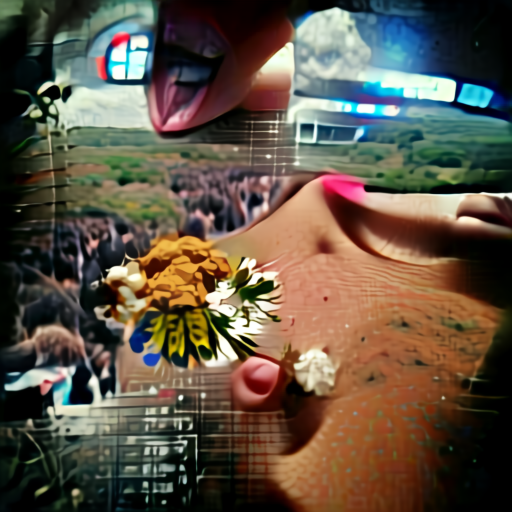



temp 2.0
0.12 lr


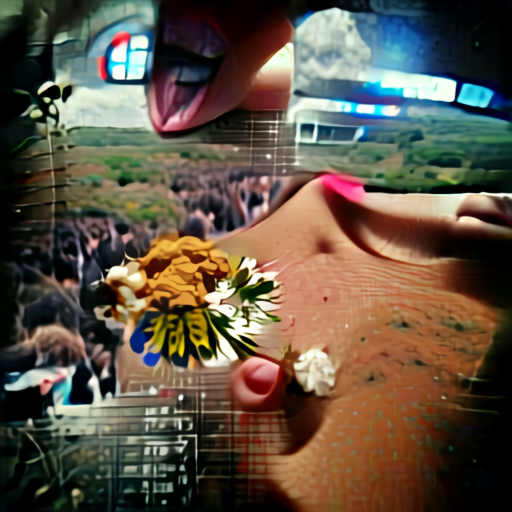




  ##########################################################
   [0, tensor([-2.4395], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1200
temp 2.0
0.12 lr


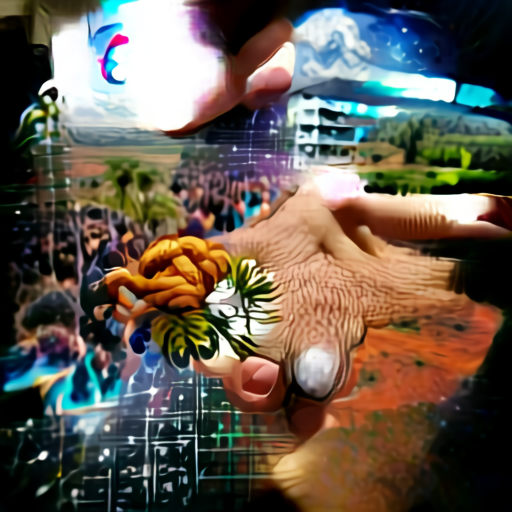




  ##########################################################
   [0, tensor([-3.8008], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1300
temp 2.0
0.12 lr


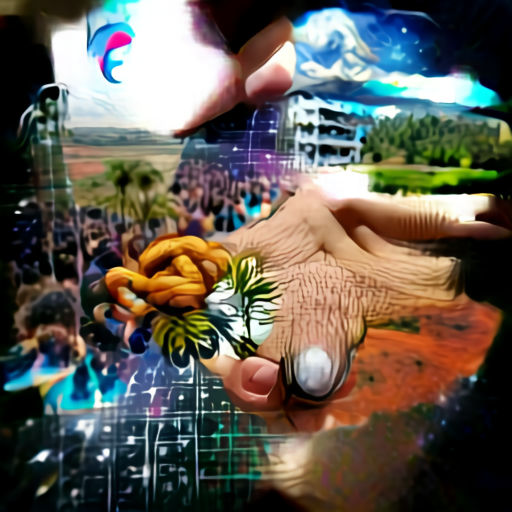




  ##########################################################
   [0, tensor([-4.0508], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1400
temp 2.0
0.12 lr


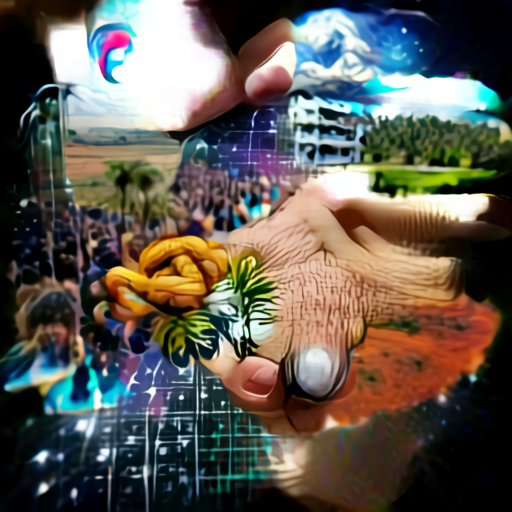




  ##########################################################
   [0, tensor([-4.2539], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1500
temp 2.0
0.12 lr


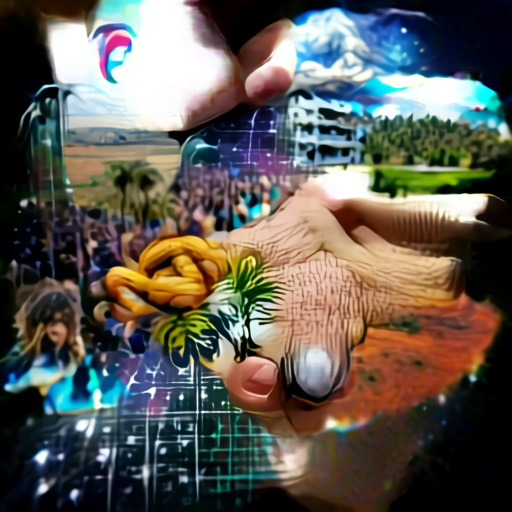




  ##########################################################
   [0, tensor([-4.2539], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1600
temp 2.0
0.12 lr


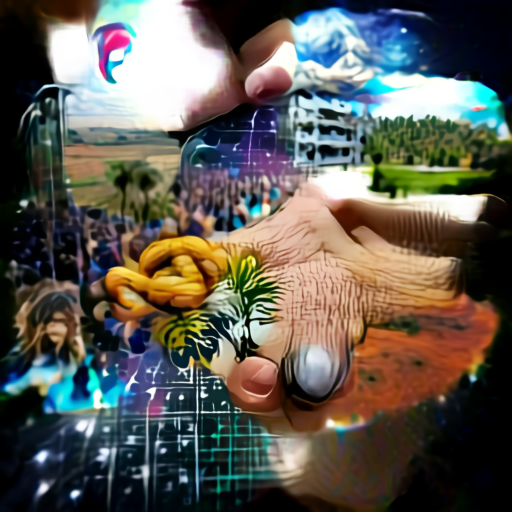




  ##########################################################
   [0, tensor([-4.1797], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1700
And Eternity in an hour


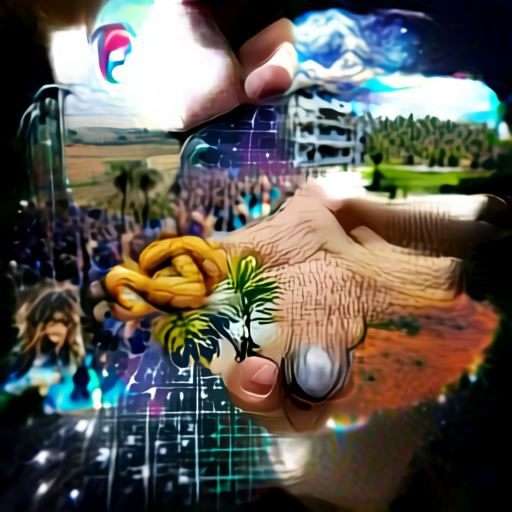



temp 2.0
0.12 lr


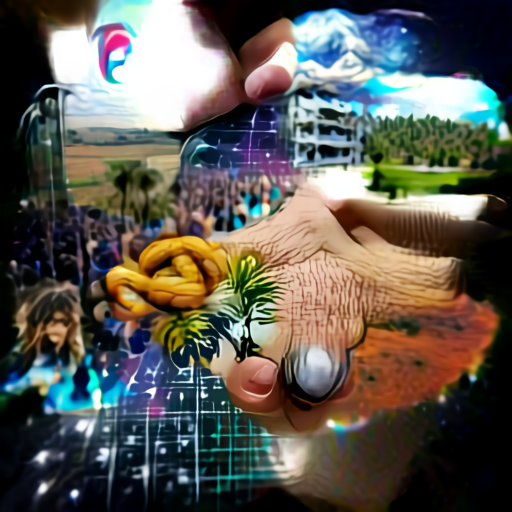




  ##########################################################
   [0, tensor([-2.6387], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1800
temp 2.0
0.12 lr


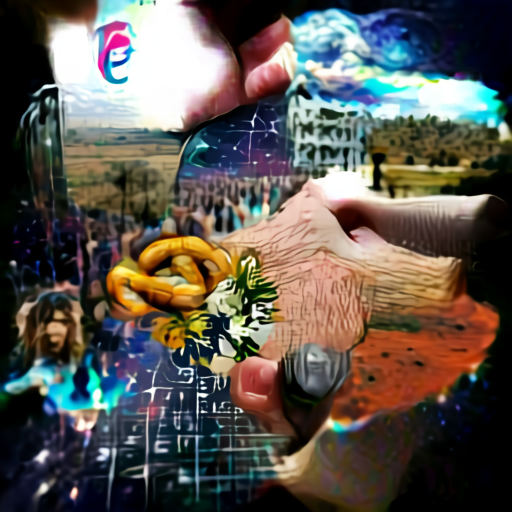




  ##########################################################
   [0, tensor([-3.1816], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 1900
temp 2.0
0.12 lr


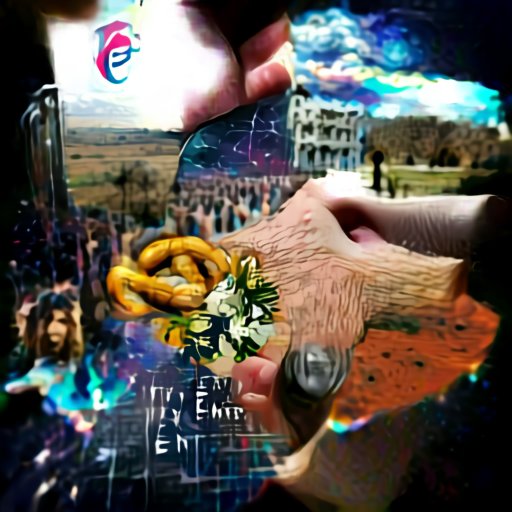




  ##########################################################
   [0, tensor([-3.2930], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2000
temp 2.0
0.12 lr


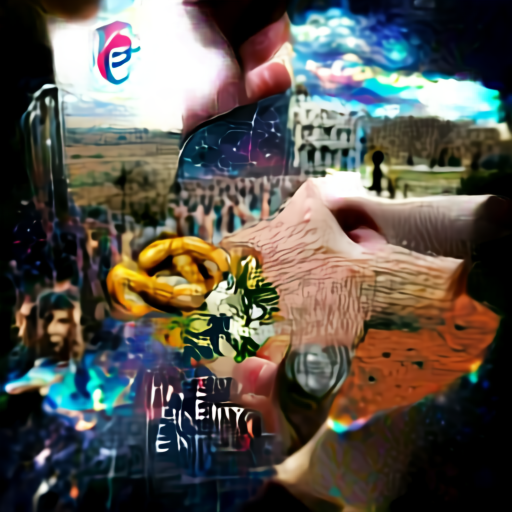




  ##########################################################
   [0, tensor([-3.5859], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2100
temp 2.0
0.12 lr


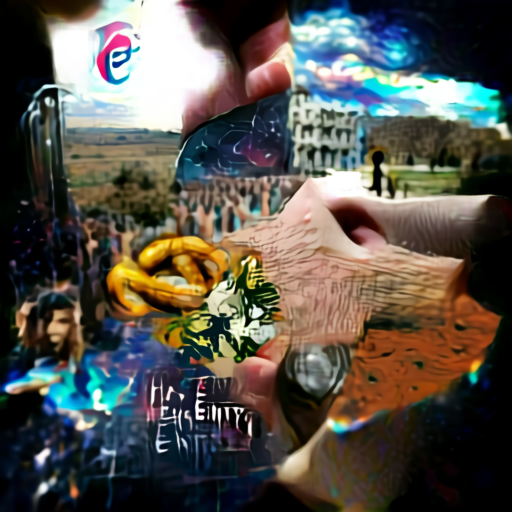




  ##########################################################
   [0, tensor([-3.4531], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2200
temp 2.0
0.12 lr


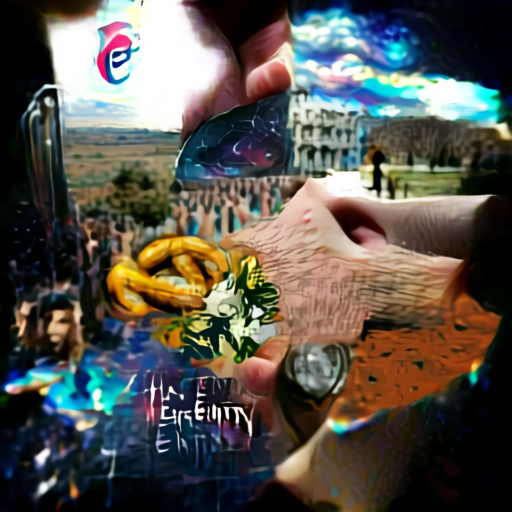




  ##########################################################
   [0, tensor([-3.6562], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2300
A Robin Red breast in a Cage


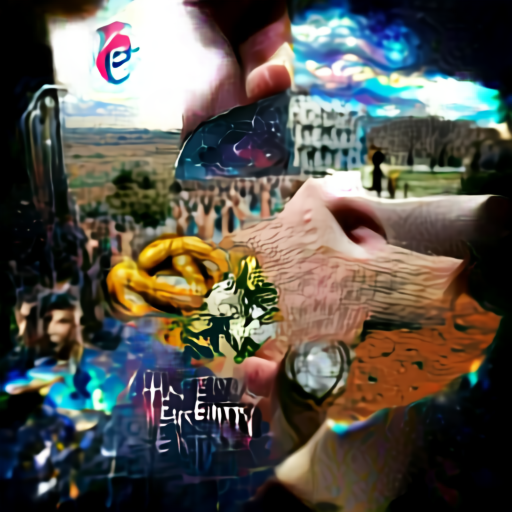



temp 2.0
0.12 lr


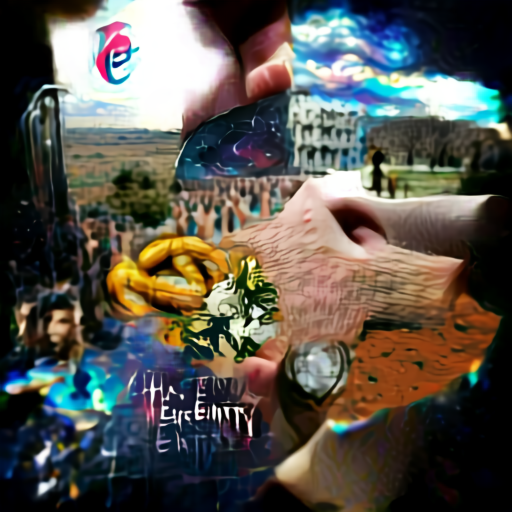




  ##########################################################
   [0, tensor([-1.5967], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2400
temp 2.0
0.12 lr


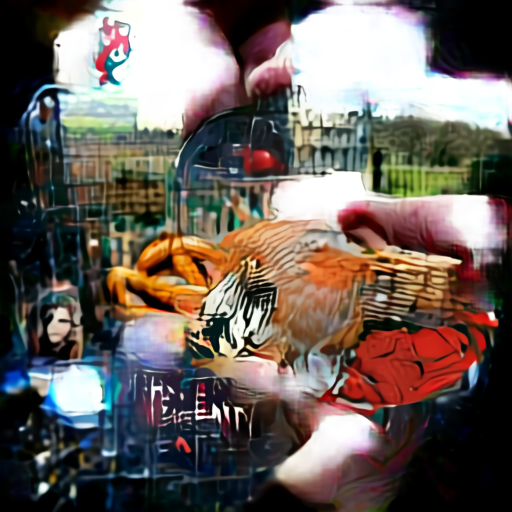




  ##########################################################
   [0, tensor([-4.0898], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2500
temp 2.0
0.12 lr


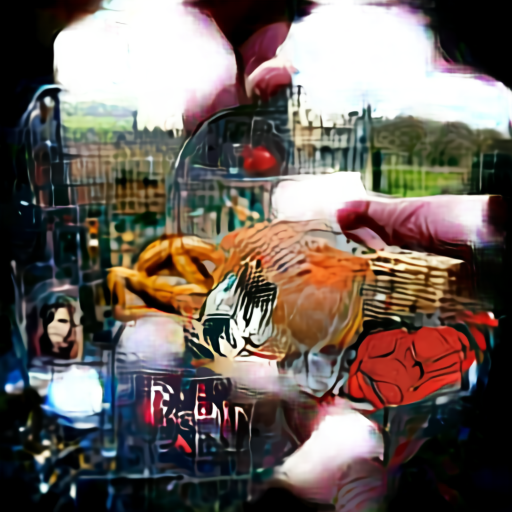




  ##########################################################
   [0, tensor([-4.4766], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2600
temp 2.0
0.12 lr


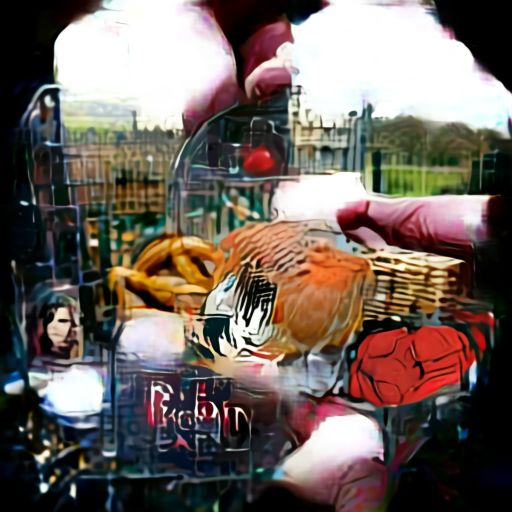




  ##########################################################
   [0, tensor([-4.7383], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2700
temp 2.0
0.12 lr


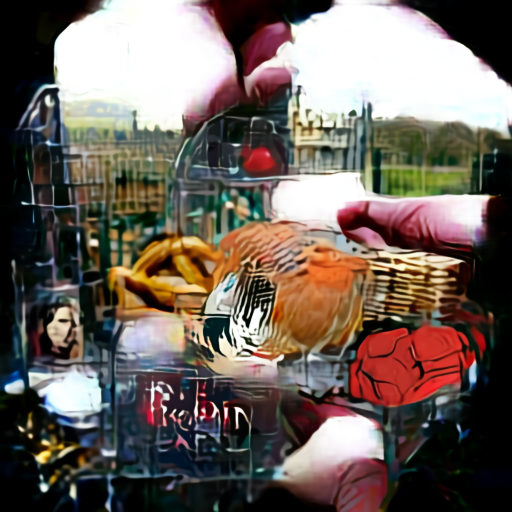




  ##########################################################
   [0, tensor([-4.7188], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2800
temp 2.0
0.12 lr


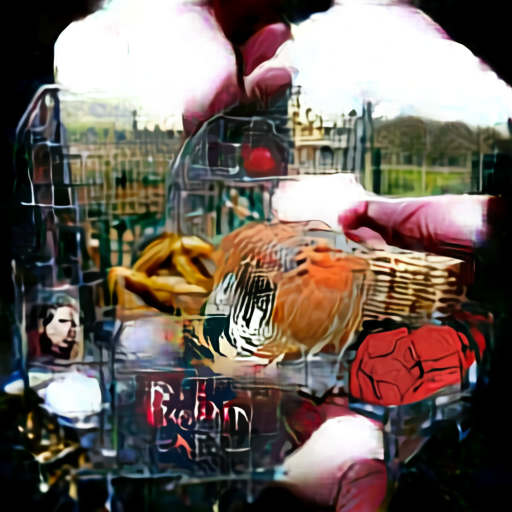




  ##########################################################
   [0, tensor([-4.7539], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 2900
Puts all Heaven in a Rage 


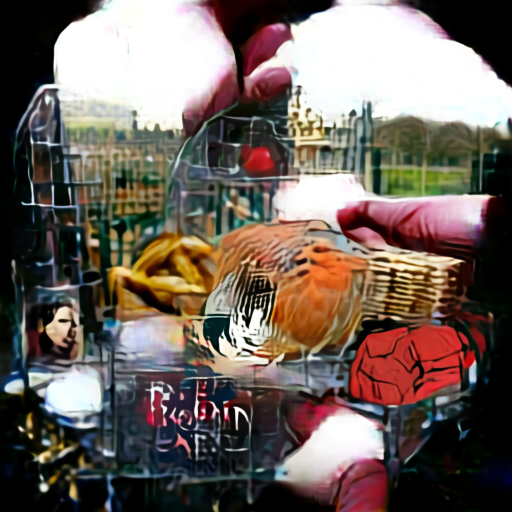



temp 2.0
0.12 lr


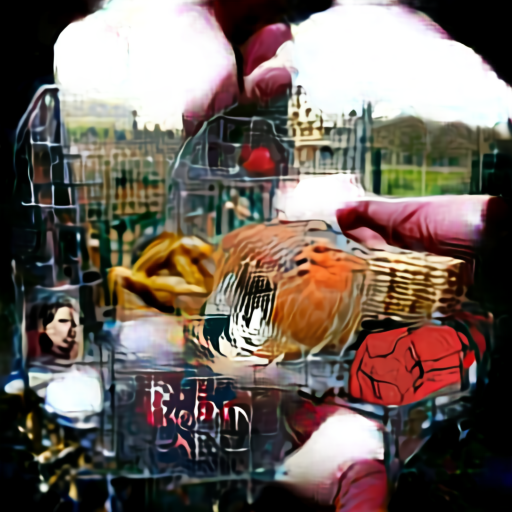




  ##########################################################
   [0, tensor([-2.2148], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 3000
temp 2.0
0.12 lr


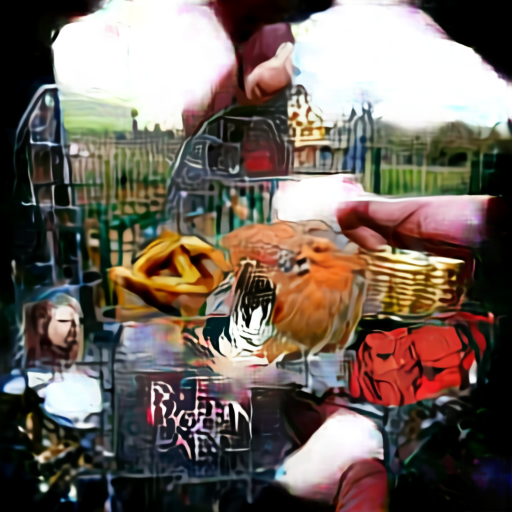




  ##########################################################
   [0, tensor([-2.7461], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 3100
temp 2.0
0.12 lr


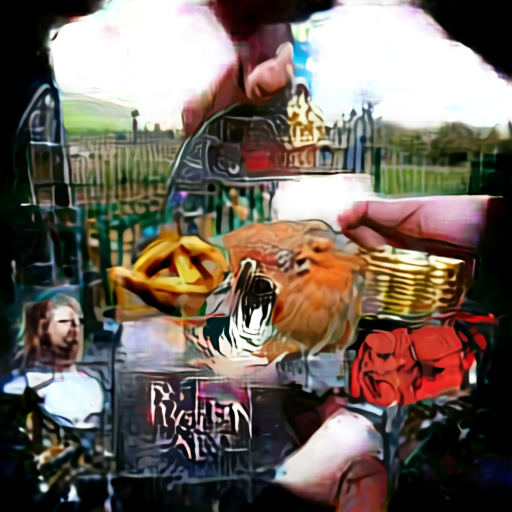




  ##########################################################
   [0, tensor([-2.8926], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 3200
temp 2.0
0.12 lr


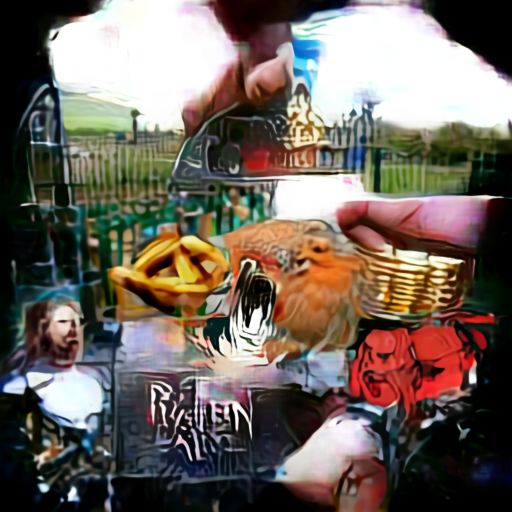




  ##########################################################
   [0, tensor([-2.9121], device='cuda:0', dtype=torch.float16, grad_fn=<MulBackward0>)]  loss
iteration 3300


In [ ]:
ctr=1
def augment(out, cutn=16):
  p_s = []
  for ch in range(cutn):
    sizey = int(torch.zeros(1,).uniform_(low, .99)*sideY)
    sizex = int(torch.zeros(1,).uniform_(low, .99)*sideX)
    offsetx = torch.randint(0, sideX - sizex, ())
    offsety = torch.randint(0, sideY - sizey, ())
    apper = out[:, :, offsetx:offsetx + sizex, offsety:offsety + sizey]
    # apper = TF.adjust_hue(apper, np.random.uniform(-.1, .1))
    # apper = TF.rotate(apper, np.random.uniform(-30, 30))
    apper = apper + .1*torch.rand(1,1,1,1).cuda()*torch.randn_like(apper, requires_grad=True)
    apper = torch.nn.functional.interpolate(apper, (224,224), mode='bilinear')
    p_s.append(apper)
  into = augs(torch.cat(p_s, 0))
  return into

def checkin(loss, S):
  global ctr
  global hadies
  
  with torch.no_grad():
    
    alnot = unmap_pixels(torch.sigmoid(model(lats())[:, :3]).float())
    al = augment(alnot, cutn=1)
    #for allls in al.cpu():
    #  displ(allls)
    #  display.display(display.Image(str(3)+'.png'))
    #  print('\n')
    for allls in alnot.cpu():
      displ(allls)
      display.display(display.Image(str(3)+'.png'))
      print('\n')

      img = Image.open('3.png')
      draw = ImageDraw.Draw(img)
      font = ImageFont.load_default()
      #font = ImageFont.truetype("Arial.ttf", 18)


      draw.text((30, 30),S,(255,255,255), font=font)
      img.save('4.png')
  
      shutil.copyfile("4.png", "/content/drive/MyDrive/images/img"+str(ctr)+".png")
      ctr+=1
  
  print('''
  ##########################################################
  ''',
        loss, ' loss\niteration',itt)


  # the people spoke and they love "ding"
  output.eval_js('new Audio("https://freesound.org/data/previews/80/80921_1022651-lq.ogg").play()')


low = .5

def ascend_txt():
  out = unmap_pixels(torch.sigmoid(model(lats())[:, :3].float()))

  into = augment(out)
  

  into = nom((into))

  


  iii = perceptor.encode_image(into)


  lat_l = 0



  return [lat_l, 10*-torch.cosine_similarity(t, iii).view(-1, batch_size).T.mean(1)]

def train(i, S):
  global hadies
  global low
  loss1 = ascend_txt()
  loss = loss1[0] + loss1[1]
  loss = loss.mean()
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()
  
  # hadies *= 1.01
  # hadies = min(hadies, 100)

  # low -= .01
  # low = max(low, .5)

  for g in optimizer.param_groups:
    g['lr'] = g['lr']*1.005
    g['lr'] = min(g['lr'], .12)
    
  
  if itt % 100 == 0:
    print('temp', hadies)
    for g in optimizer.param_groups:
      print(g['lr'], 'lr')
    checkin(loss1, S)

lats = Pars().cuda()
mapper = [lats.normu]
optimizer = torch.optim.Adam([{'params': mapper, 'lr': .01}])
eps = 0

text = '''To see a World in a Grain of Sand
And a Heaven in a Wild Flower 
Hold Infinity in the palm of your hand 
And Eternity in an hour
A Robin Red breast in a Cage
Puts all Heaven in a Rage 
A Dove house filld with Doves and Pigeons
Shudders Hell through all its regions 
A dog starvd at his Masters Gate
Predicts the ruin of the State 
A Horse misusd upon the Road
Calls to Heaven for Human blood 
Each outcry of the hunted Hare
A fibre from the Brain does tear 
A Skylark wounded in the wing 
A Cherubim does cease to sing 
The Game Cock clipd & armed for fight
Does the Rising Sun affright 
Every Wolfs & Lions howl
Raises from Hell a Human Soul'''

itt = 0
for ss in text.split("\n"):


  print(ss)
  tx = clip.tokenize(ss)
  t = perceptor.encode_text(tx.cuda()).detach().clone()


  nom = torchvision.transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
  # augs = torch.nn.Sequential(kornia.augmentation.ColorJitter(.1,.1,.1,.1, p=.5)).cuda()
  augs = kornia.augmentation.RandomRotation(30).cuda()

  will_it = False
  hadies = 2.
  with torch.no_grad():
    al = unmap_pixels(torch.sigmoid(model(lats()).cpu().float())).numpy()
    for allls in al:
      displ(allls[:3])
      print('\n')
  for ii in range(600):
    train(itt, ss)
    itt+=1



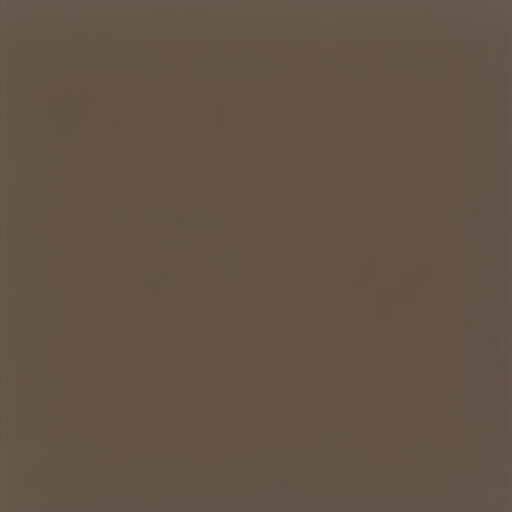

In [25]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# The nmkd 224 version

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


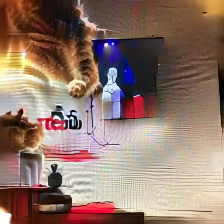

In [15]:
with torch.no_grad():
  alnot = unmap_pixels(torch.sigmoid(model(lats())[:, :3]).float())
  alnot = torch.nn.functional.interpolate(alnot, (224,224), mode='bilinear')
  for allls in alnot.cpu():
    displ(allls)
    print('\n')

# Sharpie

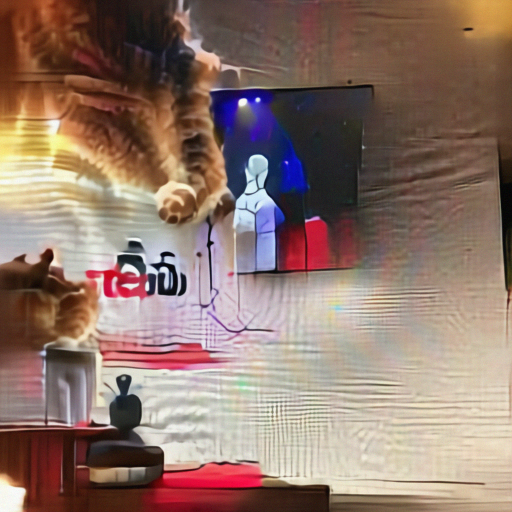

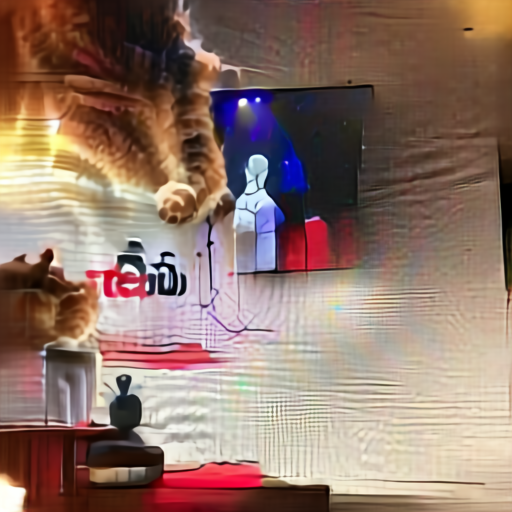

In [16]:
with torch.no_grad():
    
    alnot = unmap_pixels(torch.sigmoid(model(lats())[:, :3]).cpu().float())
    al = (alnot + .01*torch.randn_like(alnot, requires_grad=True)).numpy()
    for allls in al:
      displ(allls)
      print('\n')
    for allls in alnot:
      displ(allls)
      print('\n')

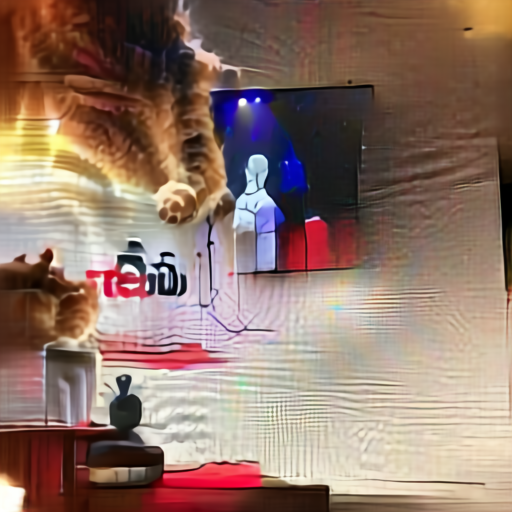



tensor([[[[7.4577e-05, 2.4150e-04, 6.4957e-05,  ..., 1.3694e-04,
           2.2731e-04, 1.2444e-04],
          [1.2695e-04, 4.5512e-05, 5.4277e-05,  ..., 5.1991e-05,
           8.2510e-05, 9.3423e-05],
          [1.9839e-05, 3.5315e-04, 6.6881e-05,  ..., 1.0348e-04,
           9.9326e-05, 1.6327e-04],
          ...,
          [5.1105e-05, 6.6656e-05, 2.0064e-05,  ..., 7.0936e-05,
           9.4690e-05, 9.9546e-05],
          [9.3395e-05, 6.5047e-05, 6.1315e-05,  ..., 4.6358e-05,
           1.1336e-04, 1.6438e-04],
          [9.2239e-05, 2.0045e-04, 2.5390e-04,  ..., 2.5722e-05,
           3.3687e-04, 1.4739e-04]],

         [[8.4744e-05, 2.1316e-04, 1.0720e-04,  ..., 4.9801e-05,
           3.2633e-05, 1.3575e-04],
          [1.2383e-04, 2.5584e-04, 2.4958e-04,  ..., 1.1318e-04,
           9.3981e-05, 1.2360e-04],
          [1.7434e-04, 8.2672e-05, 3.6535e-04,  ..., 5.8276e-05,
           3.5907e-04, 1.8672e-04],
          ...,
          [7.9842e-05, 8.7713e-06, 3.5848e-05,  ..., 3.25

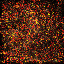

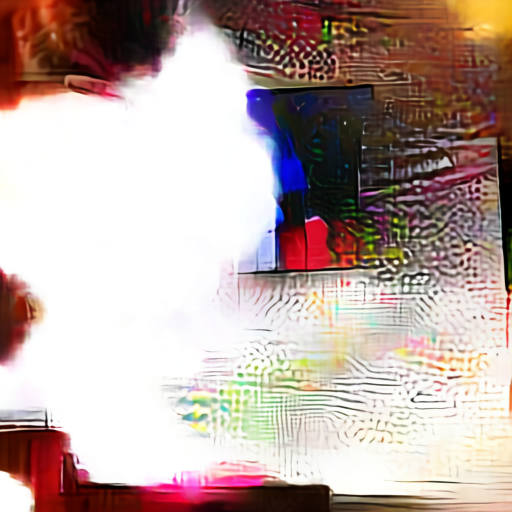



tensor([[[[2.5027e-05, 6.4178e-05, 2.4583e-05,  ..., 7.7351e-04,
           4.2271e-05, 4.6252e-05],
          [3.5396e-05, 4.4431e-05, 7.0327e-05,  ..., 1.2658e-04,
           8.0958e-05, 1.4680e-04],
          [4.2486e-06, 1.9043e-04, 2.8855e-06,  ..., 1.4930e-05,
           2.7542e-05, 4.0763e-04],
          ...,
          [1.1496e-05, 5.7701e-06, 6.2539e-08,  ..., 5.3843e-05,
           3.5323e-05, 7.5251e-05],
          [2.4088e-05, 2.9658e-05, 1.1508e-05,  ..., 7.6270e-05,
           5.2364e-05, 2.7202e-05],
          [5.9396e-05, 1.1520e-04, 1.8188e-04,  ..., 1.8383e-05,
           3.3868e-04, 4.7601e-05]],

         [[5.5071e-05, 7.9241e-04, 2.3322e-05,  ..., 1.9112e-05,
           5.3276e-06, 1.0480e-04],
          [4.6500e-04, 3.9914e-04, 4.8982e-05,  ..., 1.5085e-04,
           1.6560e-05, 2.0656e-05],
          [1.7525e-05, 1.8356e-04, 1.9600e-04,  ..., 8.8612e-05,
           1.4988e-05, 3.4829e-05],
          ...,
          [5.5320e-05, 2.2124e-06, 2.6699e-07,  ..., 6.61

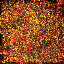

In [17]:

hadies = 2
will_it = True

with torch.no_grad():
  lll = lats()
  al = unmap_pixels(torch.sigmoid(model(lll)[:, :3]).cpu().float()).numpy()
  for allls in al:
    displ(allls)
    print('\n')

  print(lll)
  # print(torch.sum(lll))
  displ(torch.topk(lll.view(batch_size, 8192, 64, 64), k=3, dim=1)[0].cpu().numpy()[0])




hadies = 1.5

with torch.no_grad():
  lll = lats()
  al = unmap_pixels(torch.sigmoid(model(lll)[:, :3]).cpu().float()).numpy()
  for allls in al:
    displ(allls)
    print('\n')

  print(lll)
  # print(torch.sum(lll))
  displ(torch.topk(lll.view(batch_size, 8192, 64, 64), k=3, dim=1)[0].cpu().numpy()[0])

In [18]:

# tx = clip.tokenize("eros")
im = (torch.tensor(np.array(PIL.Image.open('/content/download - 2021-03-01T005117.235.png'))).unsqueeze(0)/255).permute(0,3,1,2)

with torch.no_grad():
  im = torch.nn.functional.interpolate(nom(unmap_pixels(torch.sigmoid(model(lats())[:, :3]).cpu().float())), (224, 224))
  perceptor(im.cuda(), tx.cuda())[0]

FileNotFoundError: ignored